# Breast Cancer Detection

### Classify tumors into malignant (cancerous) or benign(non-cancerous)

In [2]:
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
#Loading Dataset
df = pd.read_csv('breastCancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df.shape

(569, 33)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [6]:
#Checking Missing Values
df.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [7]:
#Dropping Id, Unnamed Column
df = df.drop(columns=['id', 'Unnamed: 32'], axis=1)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [9]:
df.shape

(569, 31)

In [10]:
#CHecking Duplicate
df.duplicated().any()

False

Id and Unanamed column are dropped as unnamed is mostly Nan value and Id we don't need in further data preprocessing

1. We can exclude unnecessary columns from the dataset and separate dependent (y) and and independent(X) data:
2. There is an id that cannot be used for classification.
3. Diagnosis is our class label.
4. Unnamed: 32 feature includes NaN so we do not need it.

In [11]:
df.isna().sum().sum()

0

There are no missing values, so we don't need to handle them, let us now continue further processes to handle outliers

### HANDLING OUTLIERS

There are many methods to handle and remove outliers
1. Interquartile Range (IQR) Method: Detect and remove outliers using the IQR (Q3 - Q1). Values outside 1.5 times the IQR are considered outliers.

2. Z-Score Method: This method standardizes the data, and outliers are defined as points beyond a certain number of standard deviations (usually 3).

After, seeing the distribution we will chosse to go with which outlier handling methods.
- For normal distribution use Z-Score Method
- For skewed distribution use IQR method

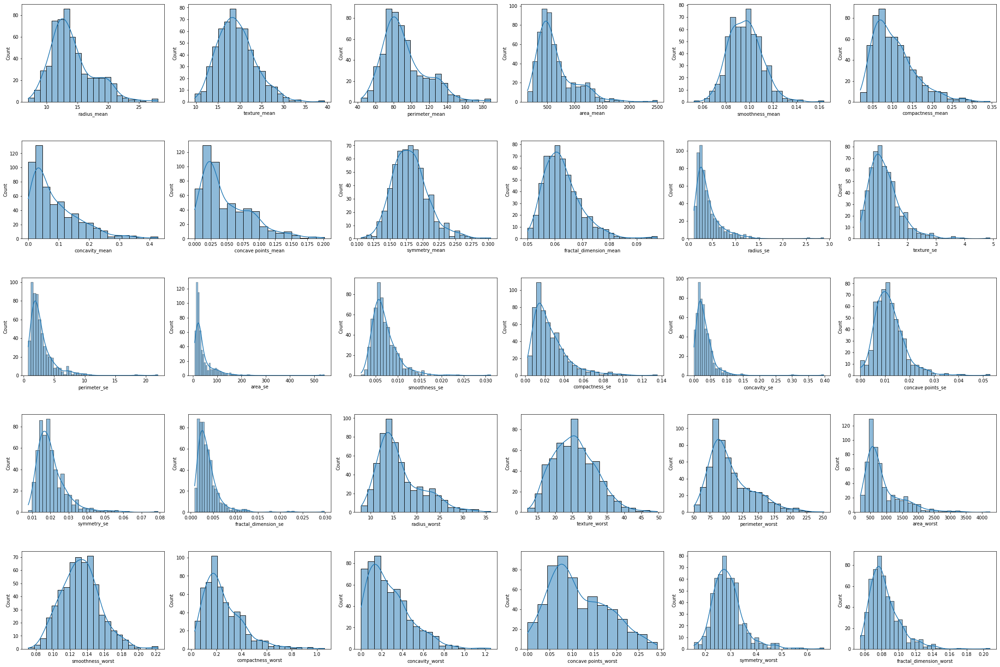

In [12]:
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in df.items():
    if df[k].dtype == 'object':
        continue
    sns.histplot(x=k, data=df, ax=axs[index],kde=True)
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

Mostly, the histograph of features are skewed, we need to use IQR method to remove the outliers.

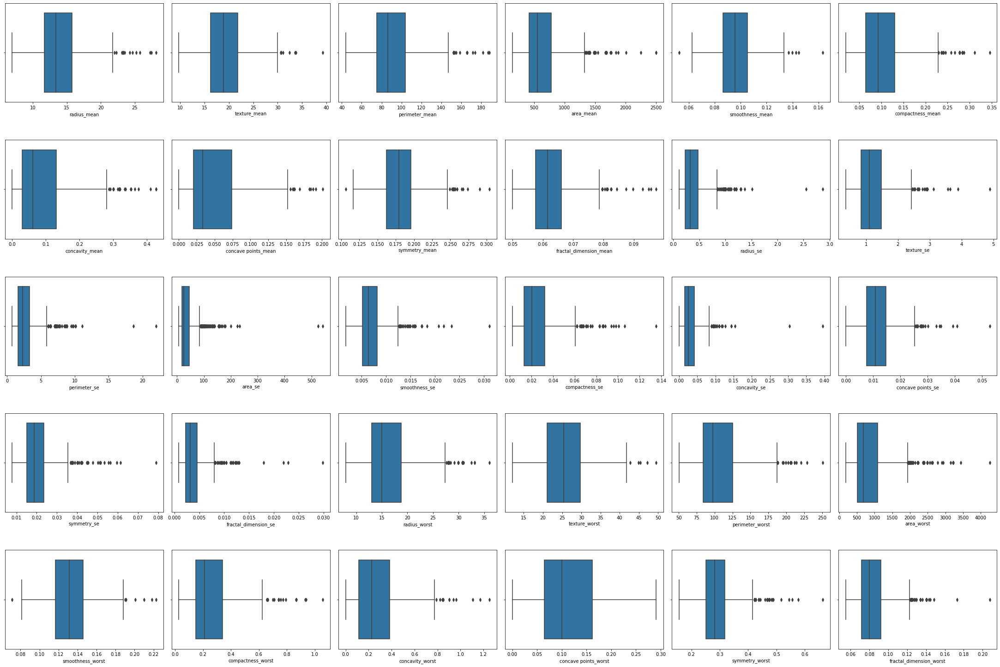

In [13]:
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in df.items():
    if df[k].dtype == 'object':
        continue
    sns.boxplot(x=k,data=df, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

From, the boxplot it seems that there are many outliers, which we need to remove by IQR method

### OUTLIER REMOVAL

In [14]:
def remove_outliers(df):
    new_df = df.copy()

    for column in df.select_dtypes(include=np.number).columns:
        Q1 = new_df[column].quantile(0.25)
        Q3 = new_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Remove outliers
        new_df = new_df[(new_df[column] >= lower_bound) & (new_df[column] <= upper_bound)]

    return new_df

cleaned_df = remove_outliers(df)
cleaned_df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
16,M,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,...,19.07,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216
19,B,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,...,15.11,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259
20,B,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,...,14.50,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183
21,B,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,...,10.23,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773
37,B,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,...,13.30,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169


In [15]:
cleaned_df.shape

(277, 31)

Now plotting boxplot again to check outlier

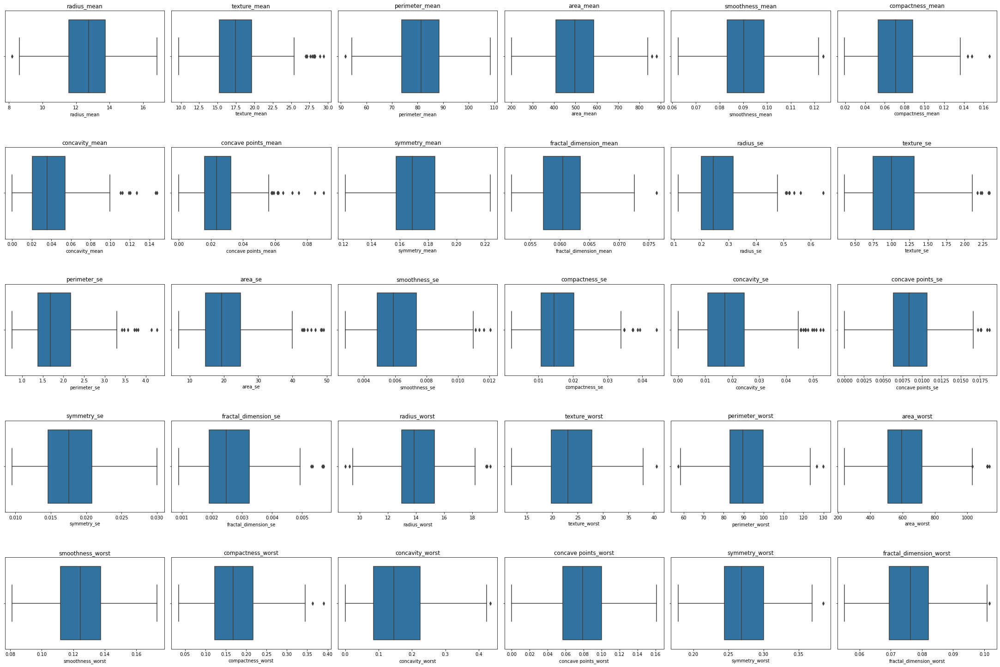

In [16]:
# Remove outliers
cleaned_df = remove_outliers(df)
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
axs = axs.flatten()

index = 0
for k in cleaned_df.columns:
    if cleaned_df[k].dtype == 'object':
        continue
    
    sns.boxplot(x=cleaned_df[k], ax=axs[index])  # Hide outlier points
    axs[index].set_title(k)
    
    index += 1
    if index >= len(axs):
        break

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
plt.show()


## Visulaization 

In [17]:
category_counts = df['diagnosis'].value_counts()
category_counts


B    357
M    212
Name: diagnosis, dtype: int64

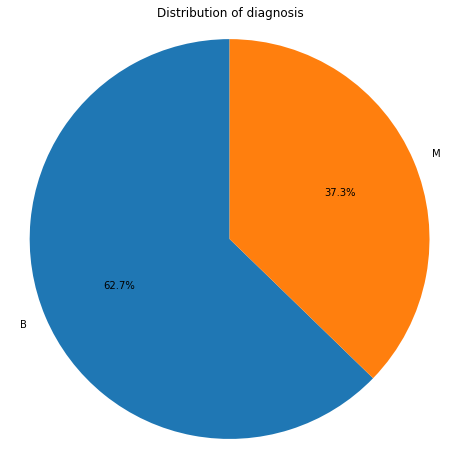

In [18]:
#pie chart
plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of diagnosis')
plt.axis('equal') 
plt.show()

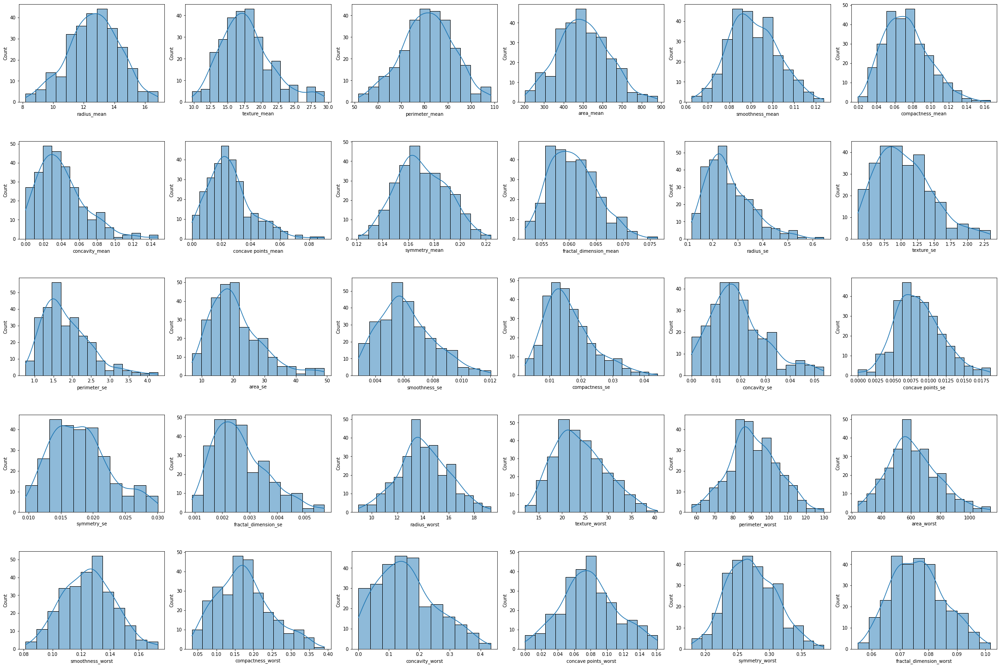

In [20]:
#Histogram
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in cleaned_df.items():
    if cleaned_df[k].dtype == 'object':
        continue
    sns.histplot(x=k, data=cleaned_df, ax=axs[index],kde=True,bins='auto')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [21]:
#Distplot


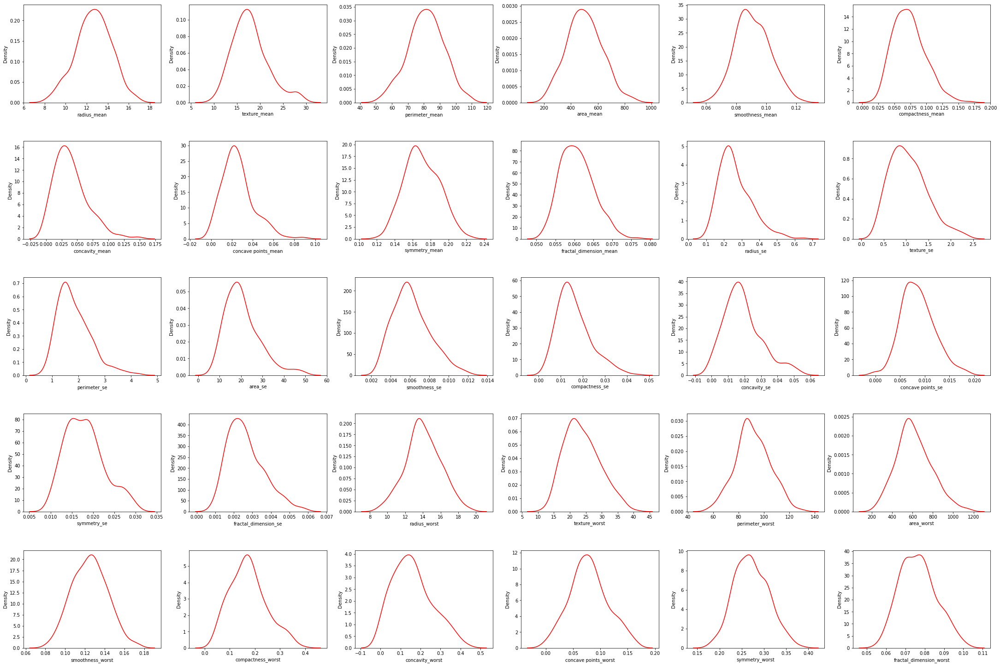

In [22]:
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in cleaned_df.items():
    if cleaned_df[k].dtype == 'object':
        continue
    sns.kdeplot(data=cleaned_df[k], ax=axs[index], color='red')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

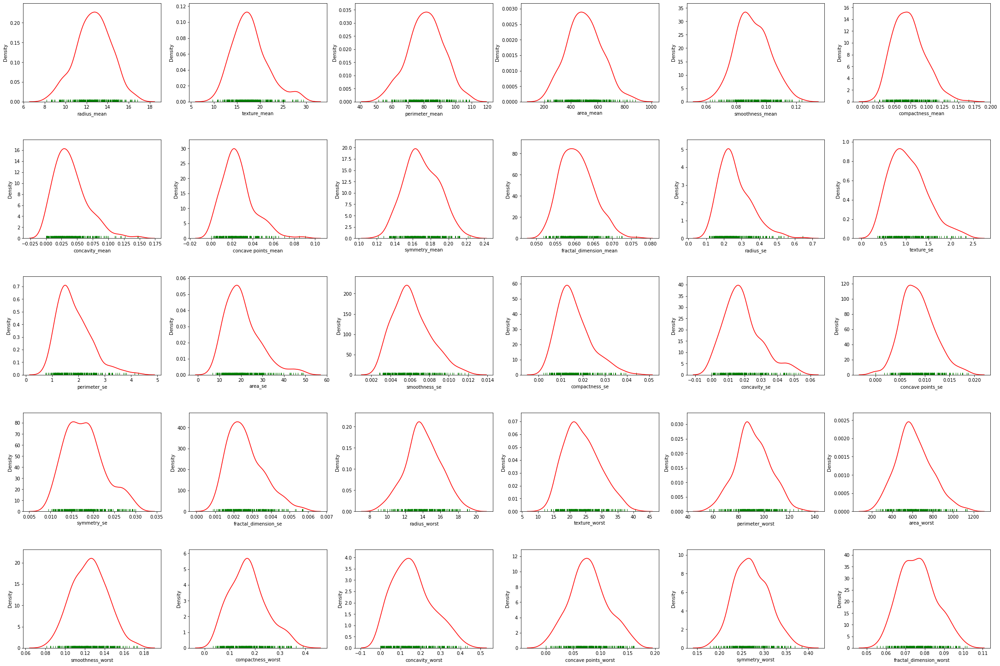

In [23]:
#density graph with rugs
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in cleaned_df.items():
    if cleaned_df[k].dtype == 'object':
        continue
    sns.kdeplot(data=cleaned_df[k], ax=axs[index], color='red')
    sns.rugplot(cleaned_df[k], ax=axs[index],color='green')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

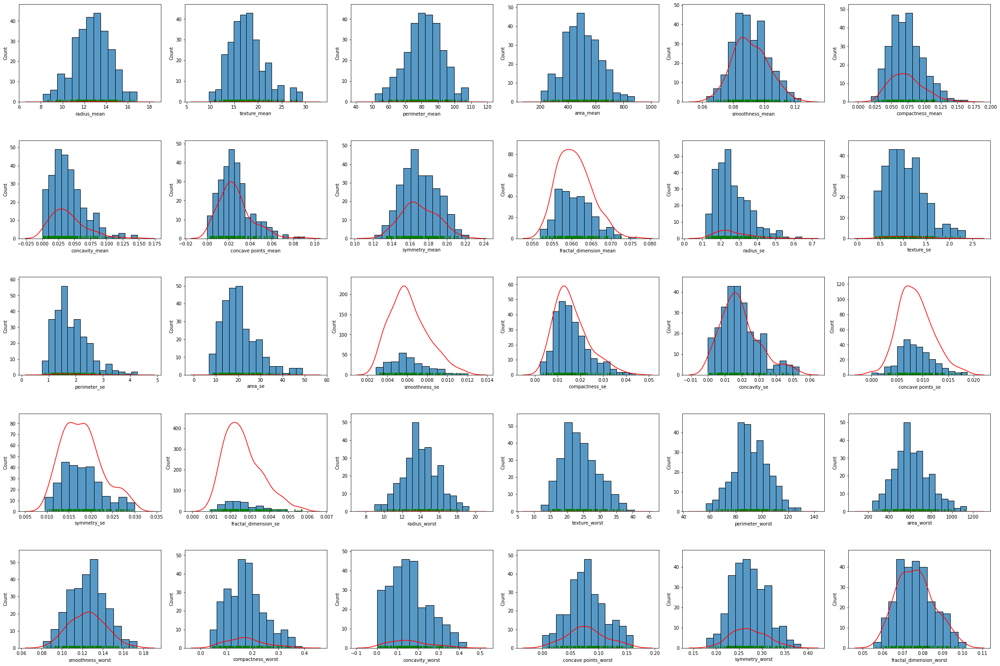

In [24]:
#Histogram, density graph and rugs together
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=(30, 20))
index = 0
axs = axs.flatten()
for k,v in cleaned_df.items():
    if cleaned_df[k].dtype == 'object':
        continue
    sns.histplot(x=k,data=cleaned_df, ax=axs[index],bins='auto')
    sns.kdeplot(data=cleaned_df[k], ax=axs[index], color='red')
    sns.rugplot(cleaned_df[k], ax=axs[index],color='green')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

We can see that in radius_mean', 'texture_mean', 'perimeter_mean','area_mean' density plot reaches 0, so its difficult to visualise, let us now, again do the density plot with laplace smoothing for them

In [25]:
cleaned_df_laplace_features = cleaned_df[[ 'radius_mean','texture_mean', 'perimeter_mean','area_mean']]

In [26]:
cleaned_df_laplace_features.head()

,radius_mean,texture_mean,perimeter_mean,area_mean
16,14.680,20.13,94.74,684.5
19,13.540,14.36,87.46,566.3
20,13.080,15.71,85.63,520.0
21,9.504,12.44,60.34,273.9
37,13.030,18.42,82.61,523.8


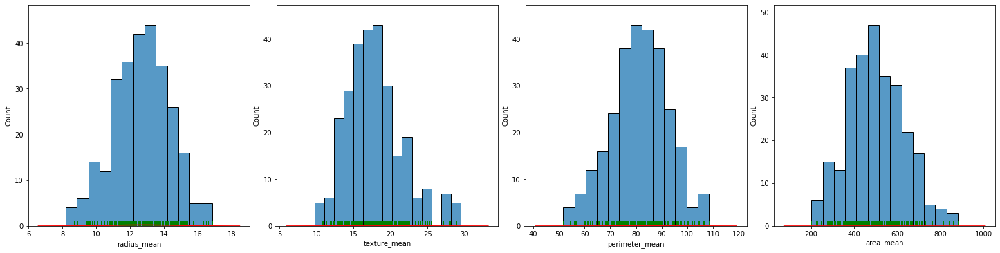

In [27]:
#Without LAPLACE SMOOTHING
#Histogram, density graph and rugs together
fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(20, 5))
index = 0
axs = axs.flatten()
for k,v in cleaned_df_laplace_features.items():
    if cleaned_df[k].dtype == 'object':
        continue
    sns.histplot(x=k, data=cleaned_df_laplace_features, ax=axs[index],bins='auto')
    sns.kdeplot(data=cleaned_df_laplace_features[k], ax=axs[index], color='red')
    sns.rugplot(cleaned_df_laplace_features[k], ax=axs[index],color='green')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

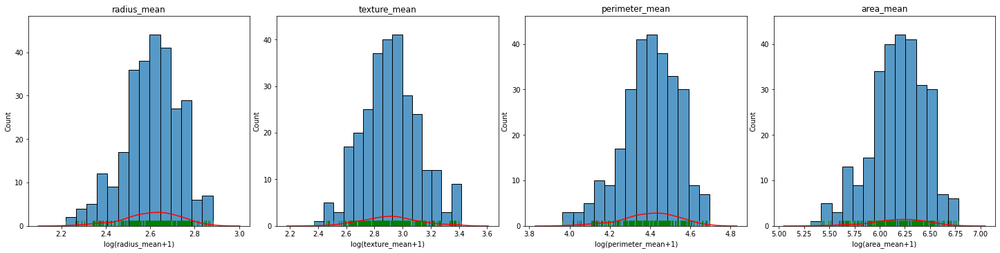

In [28]:
#PLOTTING DENSITY PLOT WITH LAPLACE SMOOTHING
fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(20, 5))
index = 0
axs = axs.flatten()
for k,v in cleaned_df_laplace_features.items():
    if cleaned_df[k].dtype == 'object':
        continue
    log_data = np.log1p(cleaned_df_laplace_features[k])
    sns.histplot(data=log_data, ax=axs[index],bins='auto',)
    sns.kdeplot(data=log_data, ax=axs[index], color='red')
    sns.rugplot(log_data, ax=axs[index],color='green')
    axs[index].set_xlabel(f'log({k}+1)')
    axs[index].set_title(f'{k}')
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

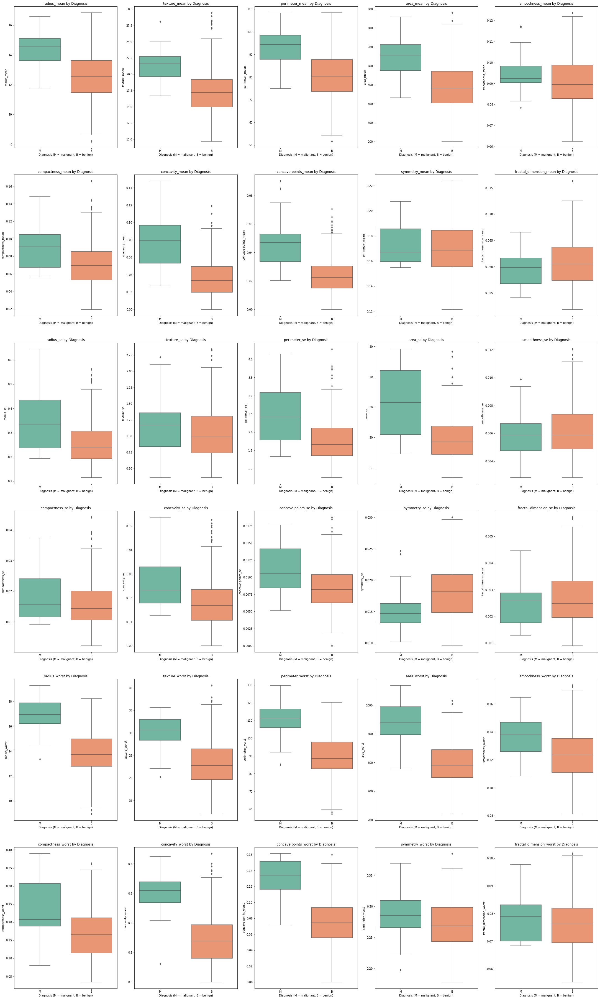

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(ncols=5, nrows=6, figsize=(30, 50))
axs = axs.flatten()
index = 0
for k in cleaned_df.select_dtypes(include=['float64', 'int64']).columns:
    sns.boxplot(x='diagnosis', y=k, data=cleaned_df, ax=axs[index], palette='Set2')
    axs[index].set_title(f'{k} by Diagnosis')  
    axs[index].set_xlabel('Diagnosis (M = malignant, B = benign)')          
    axs[index].set_ylabel(k)                    
    index += 1
    if index >= len(axs):  
        break

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
plt.show()


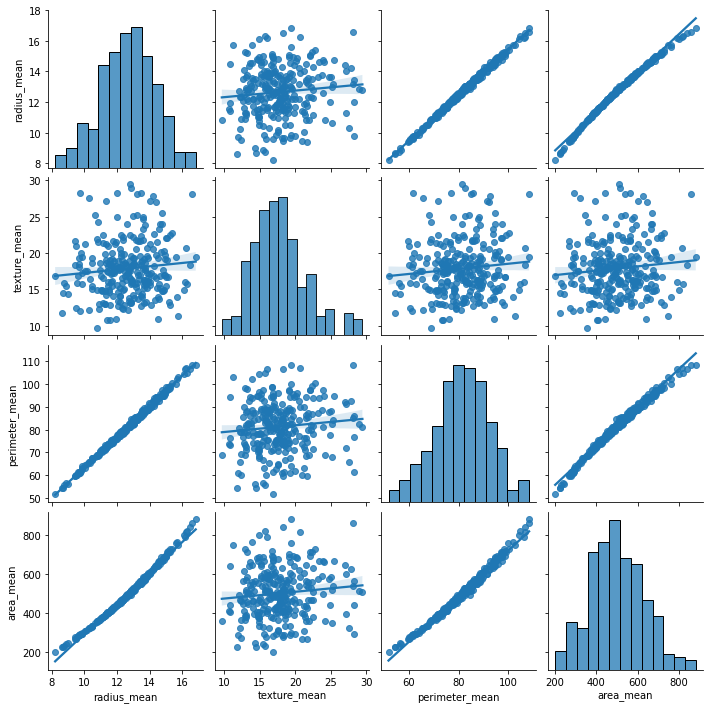

In [32]:
#PAIRPLOT
sns.pairplot(cleaned_df_laplace_features, kind='reg')
plt.show()


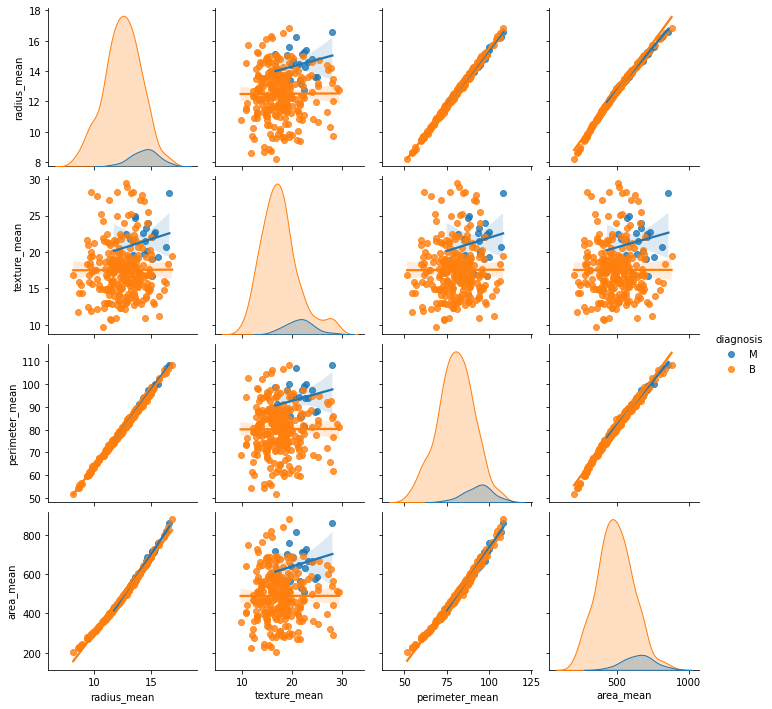

In [33]:
#PAIRPLOT 
sns_df= cleaned_df[[ 'radius_mean','texture_mean', 'perimeter_mean','area_mean','diagnosis']]
sns.pairplot(sns_df, kind='reg',hue='diagnosis')
plt.show()


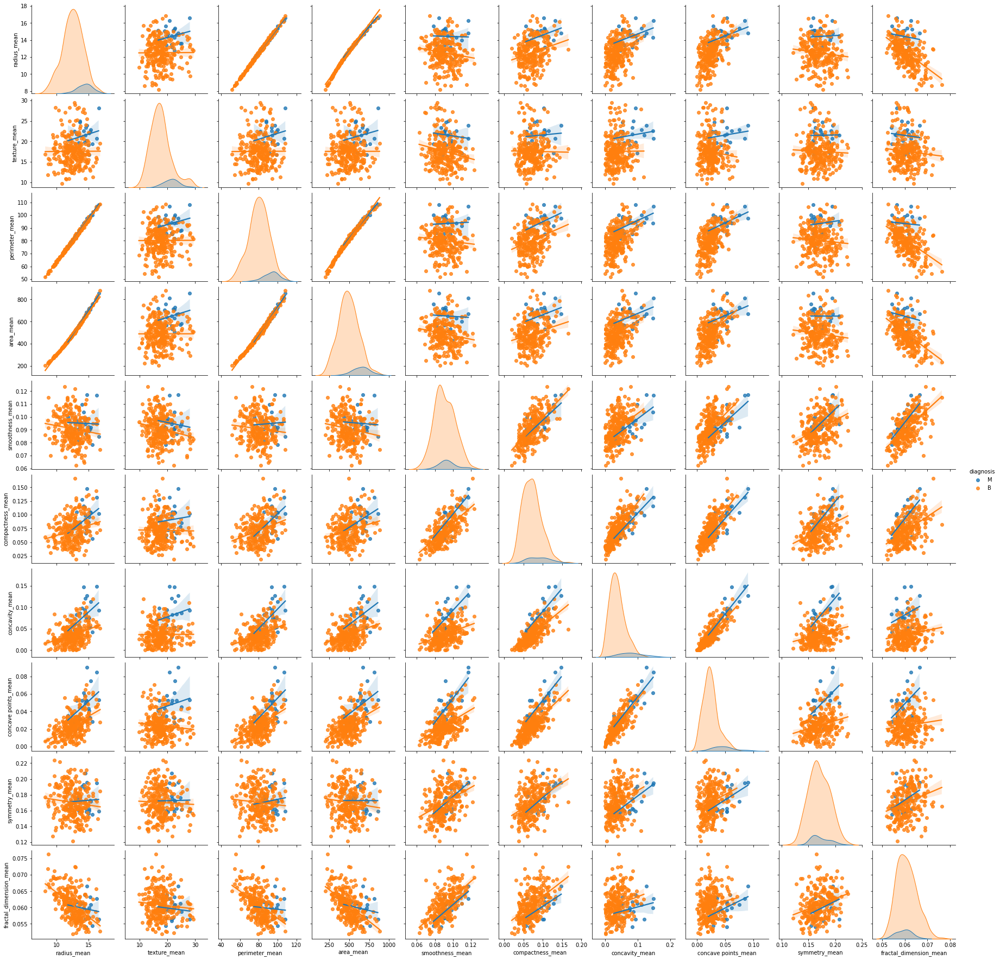

In [34]:

#PAIRPLOT 
sns_df= cleaned_df[[ 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean','area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean','concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']]
sns.pairplot(sns_df, kind='reg',hue='diagnosis')
plt.show()


No handles with labels found to put in legend.


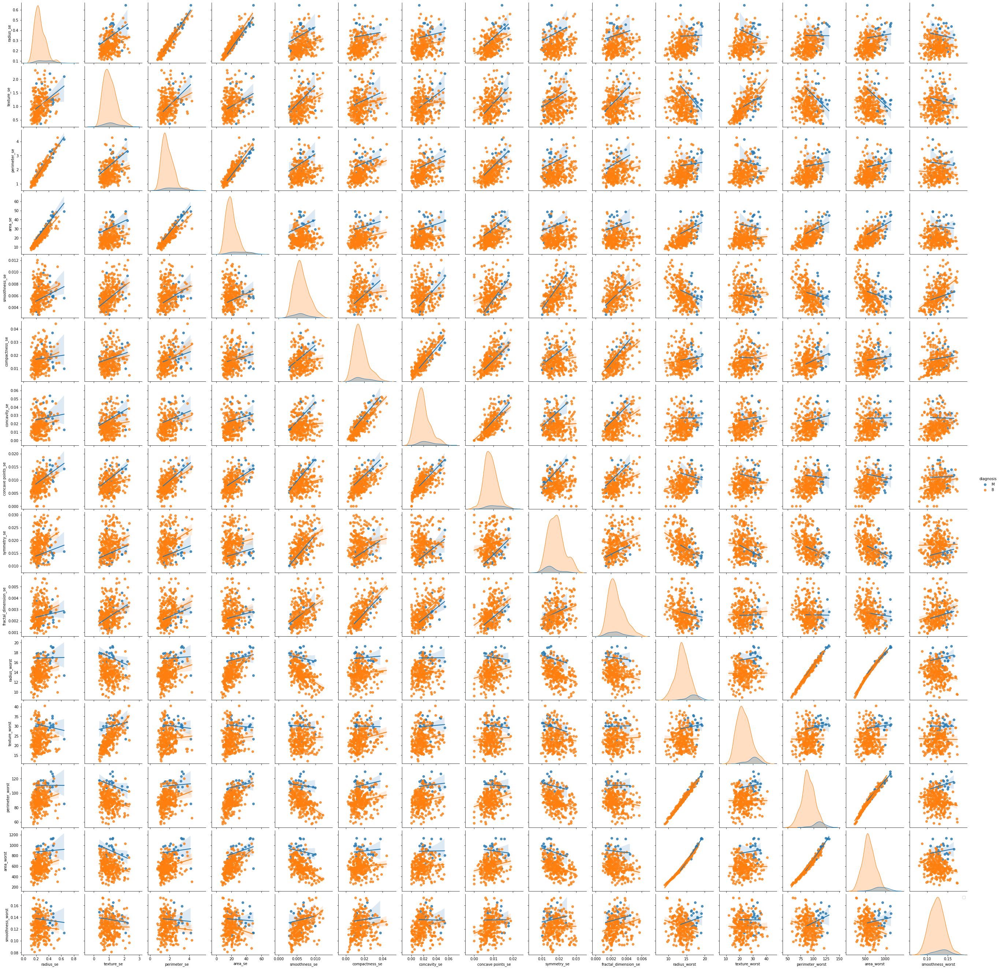

In [37]:

#PAIRPLOT 
sns_df= cleaned_df[[ 'diagnosis', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',]]
sns.pairplot(sns_df, kind='reg',hue='diagnosis')
plt.legend()
plt.show()


<Figure size 1440x1080 with 0 Axes>

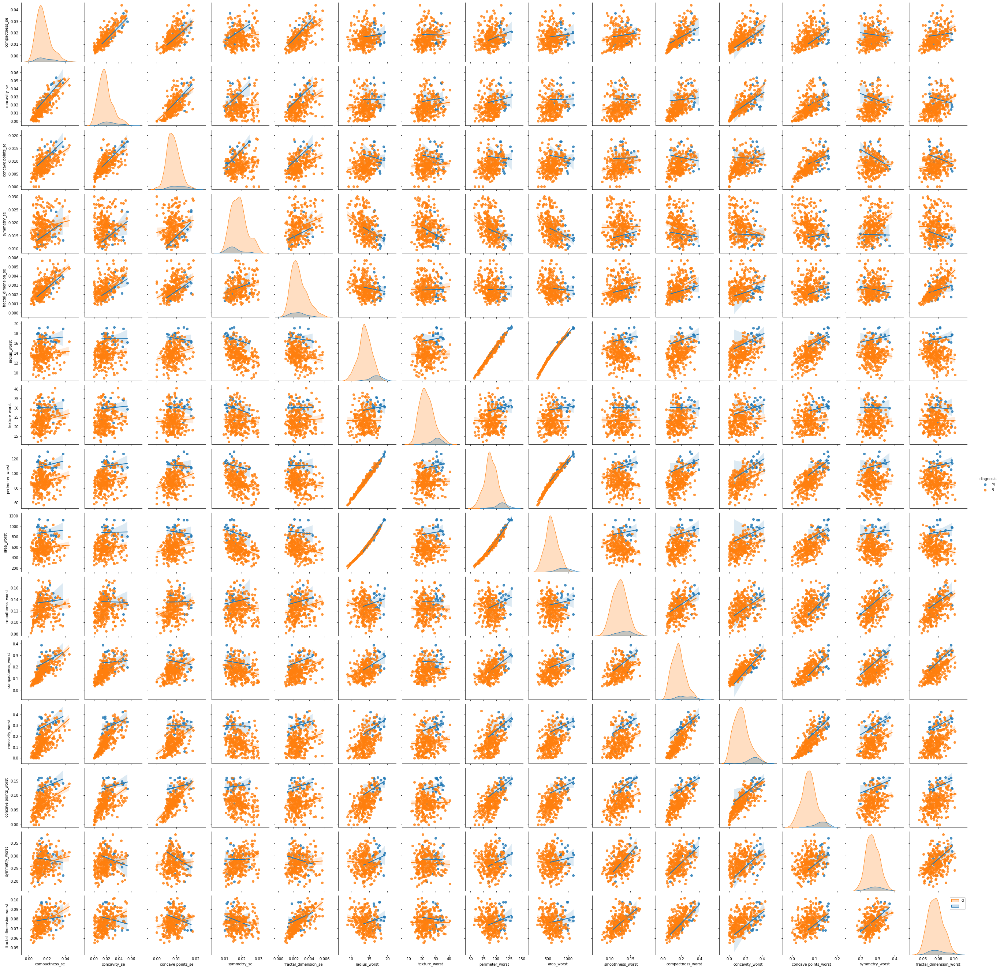

In [38]:
#PAIRPLOT 
plt.figure(figsize=(20, 15))
sns_df= cleaned_df[[ 'diagnosis', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']]
sns.pairplot(sns_df, kind='reg',hue='diagnosis')
plt.legend('diagnosis')
plt.show()


In [39]:
# Compute the correlation matrix that contains the correlation coefficients
# Drop the non-numeric column 'Species'
corr_df = cleaned_df.drop(columns=['diagnosis'])
corr_df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
16,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,0.05922,...,19.07,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216
19,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,...,15.11,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259
20,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,0.06811,...,14.50,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183
21,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,0.06905,...,10.23,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773
37,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,13.30,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,12.770,29.43,81.35,507.9,0.08276,0.04234,0.01997,0.01499,0.1539,0.05637,...,13.87,36.00,88.10,594.7,0.12340,0.10640,0.08653,0.06498,0.2407,0.06484
554,12.880,28.92,82.50,514.3,0.08123,0.05824,0.06195,0.02343,0.1566,0.05708,...,13.89,35.74,88.84,595.7,0.12270,0.16200,0.24390,0.06493,0.2372,0.07242
555,10.290,27.61,65.67,321.4,0.09030,0.07658,0.05999,0.02738,0.1593,0.06127,...,10.84,34.91,69.57,357.6,0.13840,0.17100,0.20000,0.09127,0.2226,0.08283
560,14.050,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,0.06171,...,15.30,33.17,100.20,706.7,0.12410,0.22640,0.13260,0.10480,0.2250,0.08321


In [40]:
# Compute the correlation matrix for the numeric columns
corr = corr_df.corr()
corr

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,0.098912,0.998029,0.995781,-0.091068,0.298559,0.434178,0.554701,-0.083728,-0.521110,...,0.960010,0.077381,0.952612,0.947133,-0.201197,0.311379,0.369832,0.523878,-0.077950,-0.211790
texture_mean,0.098912,1.000000,0.101699,0.102452,-0.145048,0.052245,0.140728,0.044810,-0.026563,-0.104527,...,0.134784,0.915850,0.132723,0.141961,-0.069246,0.105710,0.139326,0.087487,-0.076551,-0.034567
perimeter_mean,0.998029,0.101699,1.000000,0.993575,-0.049692,0.354838,0.479151,0.593517,-0.056259,-0.482511,...,0.961419,0.082054,0.959464,0.948466,-0.166101,0.359173,0.409636,0.560176,-0.054522,-0.171598
area_mean,0.995781,0.102452,0.993575,1.000000,-0.104641,0.285362,0.440086,0.555041,-0.087951,-0.520802,...,0.959951,0.080790,0.952524,0.955705,-0.204442,0.304844,0.373543,0.522100,-0.084516,-0.212394
smoothness_mean,-0.091068,-0.145048,-0.049692,-0.104641,1.000000,0.680442,0.404299,0.525072,0.394225,0.621608,...,-0.047510,-0.089249,-0.014761,-0.060887,0.780201,0.335255,0.253826,0.417630,0.273165,0.430924
compactness_mean,0.298559,0.052245,0.354838,0.285362,0.680442,1.000000,0.765334,0.765986,0.411677,0.478195,...,0.330803,0.067112,0.400661,0.313914,0.504948,0.803175,0.655360,0.708257,0.318485,0.550898
concavity_mean,0.434178,0.140728,0.479151,0.440086,0.404299,0.765334,1.000000,0.858145,0.296817,0.152259,...,0.474015,0.178034,0.531735,0.478111,0.366124,0.721295,0.871724,0.796971,0.218880,0.357772
concave points_mean,0.554701,0.044810,0.593517,0.555041,0.525072,0.765986,0.858145,1.000000,0.274055,0.113530,...,0.580661,0.077680,0.620854,0.575155,0.389435,0.590491,0.638008,0.864133,0.162583,0.236100
symmetry_mean,-0.083728,-0.026563,-0.056259,-0.087951,0.394225,0.411677,0.296817,0.274055,1.000000,0.280544,...,-0.063793,-0.013651,-0.023013,-0.073930,0.274367,0.281615,0.227579,0.246753,0.642203,0.204007
fractal_dimension_mean,-0.521110,-0.104527,-0.482511,-0.520802,0.621608,0.478195,0.152259,0.113530,0.280544,1.000000,...,-0.481102,-0.091580,-0.434121,-0.477856,0.557314,0.285046,0.117009,0.076566,0.253999,0.741791


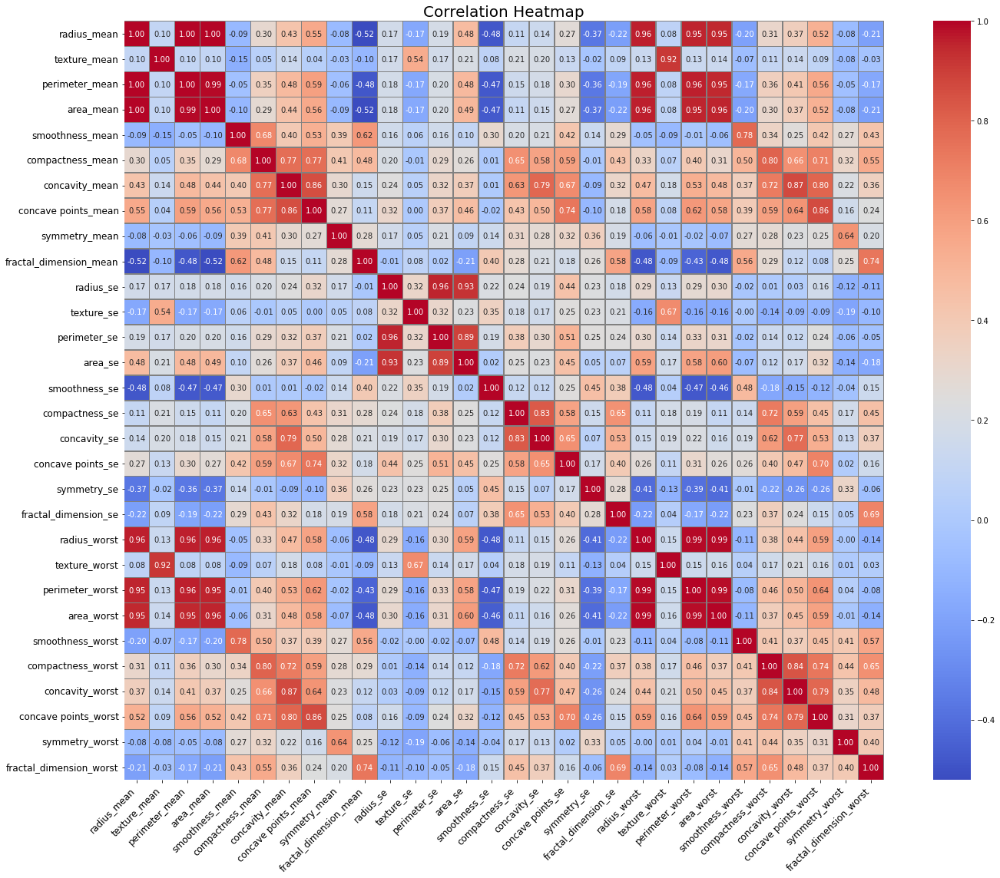

In [41]:
# Plot the heatmap with annotations
plt.figure(figsize=(20, 16))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar=True, 
            linewidths=0.5, linecolor='gray', mask=corr.isnull())

plt.title('Correlation Heatmap', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.tight_layout()
plt.show()

In [5]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [6]:
# To check commits pr for hacktober - 1

In [ ]:
# To check commits pr for hacktober - 2
